In [2]:
initialize_commands = """
#--------------------Setup-------------------------------------#
processors        * * 1
units	           metal
atom_style        atomic
boundary          p p p

#neighbor	  0.3 bin
#neigh_modify	  delay 5
atom_modify	  map yes sort 0 0.0

read_data        structure.lmp
"""

In [3]:
iap_commands = """
#------------------------ FORCE FIELDS ------------------------------
pair_style    eam/alloy
pair_coeff    * * Cu01.eam.alloy.txt Cu
"""

In [4]:
def compute_enthalpy_lmp(x, S, lx0=171.701, ly0=177.098, lz0=110, neb_image=0, dump_filepath='.', snapshot=0, write_lmp_box=False, slab_thk=75):
        
        lx, ly, lz = x
        s_xx, s_yy, s_zz = S
        
        import lammps

        lmp = lammps.lammps()
        lmp.commands_string(initialize_commands)
        lmp.commands_string(iap_commands)
        # lmp.commands_string(group_commands)

        lx_current = lmp.get_thermo('lx')
        ly_current = lmp.get_thermo('ly') 
        lz_current = lmp.get_thermo('lz')

        V0 = lx0*ly0*slab_thk

        lmp.command(f'read_dump {dump_filepath}/dump.neb.{neb_image} {snapshot} x y z')
        
        # Rescale box acc. to lx and ly
        xscale = lx/lx_current
        yscale = ly/ly_current
        zscale = lz/lz_current
        lmp.command(f"change_box all x scale {xscale} y scale {yscale} z scale {zscale} remap units box")
        lmp.command('run 0')

        u = lmp.get_thermo('pe')
        
        e_xx = lx/lx0 - 1
        e_yy = ly/ly0 - 1
        e_zz = lz/lz0 - 1

        enthl = u - (s_xx*e_xx + s_yy*e_yy + s_zz*e_zz)*V0*1e9*1e-30*6.242e18 # in eV. 

        if write_lmp_box:
                lmp.command(f'write_dump all atom dump.neb.npt.{neb_image}')

        return enthl # in eV

## On $2\%$ tension NEB path

In [5]:
compute_enthalpy_lmp((175,177, 100), (2.16,0.5, 0.007))

LAMMPS (21 Nov 2023)
OMP_NUM_THREADS environment is not set. Defaulting to 1 thread. (src/comm.cpp:98)
  using 1 OpenMP thread(s) per MPI task
Reading data file ...
  orthogonal box = (-66.057999 -84.121601 390) to (109.07703 92.976507 500)
  1 by 1 by 1 MPI processor grid
  reading atoms ...
  185160 atoms
  read_data CPU = 0.190 seconds
Scanning dump file ...
Reading snapshot from dump file ...
  orthogonal box = (-66.057999 -84.121601 390) to (109.07703 92.976507 500)
  185160 atoms before read
  185160 atoms in snapshot
  0 atoms purged
  185160 atoms replaced
  0 atoms trimmed
  0 atoms added
  185160 atoms after read
Changing box ...
  orthogonal box = (-65.990484 -84.121601 390) to (109.00952 92.976507 500)
  orthogonal box = (-65.990484 -84.072547 390) to (109.00952 92.927453 500)
  orthogonal box = (-65.990484 -84.072547 395) to (109.00952 92.927453 495)
Neighbor list info ...
  update: every = 1 steps, delay = 0 steps, check = yes
  max neighbors/atom: 2000, page size: 100000

-635097.0507646636

In [44]:
# Intial Guess
x0 = (175,177,110)

#####################
S = (2.3, 0.7, 0.001) # (Sxx, Syy) in GPa
lx0=171.701
ly0=177.098
lz0=110
#####################

def callback(xk):
        global fk, lxk, lyk, S 
        fk.append(compute_enthalpy_lmp(xk, S))
        lxk.append(xk[0])
        lyk.append(xk[1])   

LAMMPS (21 Nov 2023)
OMP_NUM_THREADS environment is not set. Defaulting to 1 thread. (src/comm.cpp:98)
  using 1 OpenMP thread(s) per MPI task
Reading data file ...
  orthogonal box = (-66.057999 -84.121601 390) to (109.07703 92.976507 500)
  1 by 1 by 1 MPI processor grid
  reading atoms ...
  185160 atoms
  read_data CPU = 0.158 seconds
Scanning dump file ...
Reading snapshot from dump file ...
  orthogonal box = (-66.057999 -84.121601 390) to (109.07703 92.976507 500)
  185160 atoms before read
  185160 atoms in snapshot
  0 atoms purged
  185160 atoms replaced
  0 atoms trimmed
  0 atoms added
  185160 atoms after read
Changing box ...
  orthogonal box = (-65.990484 -84.121601 390) to (109.00952 92.976507 500)
  orthogonal box = (-65.990484 -84.072547 390) to (109.00952 92.927453 500)
  orthogonal box = (-65.990484 -84.072547 390) to (109.00952 92.927453 500)
Neighbor list info ...
  update: every = 1 steps, delay = 0 steps, check = yes
  max neighbors/atom: 2000, page size: 100000

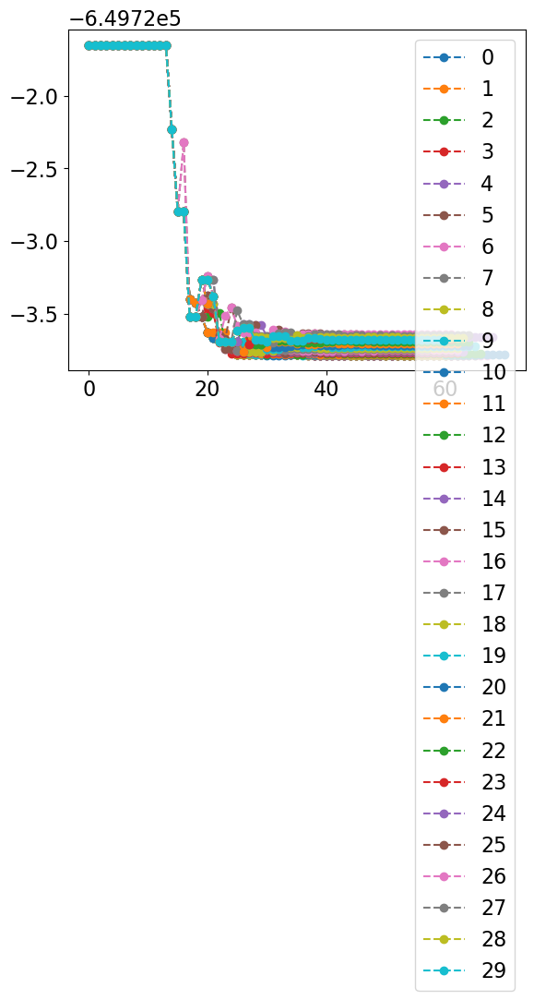

In [45]:
from scipy.optimize import minimize, Bounds
import matplotlib.pyplot as plt

res = []
for image in range(30):

        fk = []
        lxk =[]
        lyk = []
        lzk = []

        opt_result = minimize(compute_enthalpy_lmp, x0, args=(S, lx0, ly0, lz0, image, '.', image, False, 75), \
                            method='Nelder-Mead', bounds=Bounds([172, 172, 105],[178, 182, 115]), callback=callback)
        res.append(opt_result)
        compute_enthalpy_lmp(opt_result.x, S, neb_image=image, snapshot=image, write_lmp_box=True)
        plt.plot(fk, 'o--', label=f'{image}')
plt.legend()

In [46]:
import numpy as np
opt_enthalpy = np.zeros((30,2))
for i in range(30):
        opt_enthalpy[i,0] = i
        opt_enthalpy[i,1] = res[i].fun 
opt_enthalpy[:,1]-=min(opt_enthalpy[:10,1])
np.savetxt('opt_enthalpy.txt', opt_enthalpy, delimiter=' ')
       

In [47]:
res

[       message: Optimization terminated successfully.
        success: True
         status: 0
            fun: -649723.7851314096
              x: [ 1.751e+02  1.771e+02  1.100e+02]
            nit: 58
           nfev: 112
  final_simplex: (array([[ 1.751e+02,  1.771e+02,  1.100e+02],
                        [ 1.751e+02,  1.771e+02,  1.100e+02],
                        [ 1.751e+02,  1.771e+02,  1.100e+02],
                        [ 1.751e+02,  1.771e+02,  1.100e+02]]), array([-6.497e+05, -6.497e+05, -6.497e+05, -6.497e+05])),
        message: Optimization terminated successfully.
        success: True
         status: 0
            fun: -649723.7851314096
              x: [ 1.751e+02  1.771e+02  1.100e+02]
            nit: 58
           nfev: 112
  final_simplex: (array([[ 1.751e+02,  1.771e+02,  1.100e+02],
                        [ 1.751e+02,  1.771e+02,  1.100e+02],
                        [ 1.751e+02,  1.771e+02,  1.100e+02],
                        [ 1.751e+02,  1.771e+02,  1.10

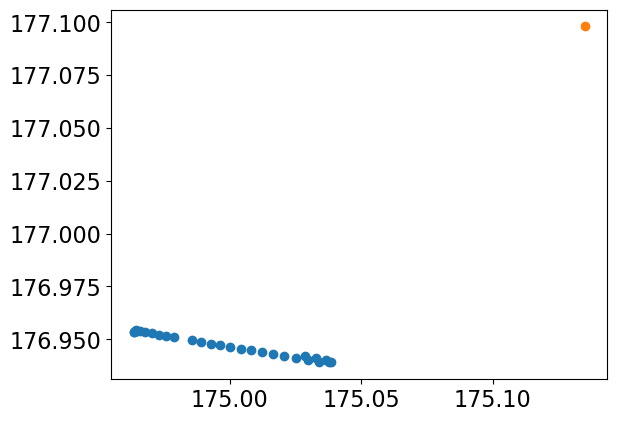

In [48]:
plt.plot(opt_lx, opt_ly, 'o')
plt.plot(175.135, 177.098, 'o')

In [49]:
import lammps
s_xx_npt = []
s_yy_npt = []
s_zz_npt = []
for image in range(30):
        lmp = lammps.lammps()
        lmp.command(f'variable image equal {image}')
        lmp.file('in.stress.npt')
        s_xx_npt.append(lmp.extract_variable('s_xx'))
        s_yy_npt.append(lmp.extract_variable('s_yy'))
        s_zz_npt.append(lmp.extract_variable('s_zz'))

LAMMPS (21 Nov 2023)
OMP_NUM_THREADS environment is not set. Defaulting to 1 thread. (src/comm.cpp:98)
  using 1 OpenMP thread(s) per MPI task
Total wall time: 16:57:58
Reading data file ...
  orthogonal box = (-66.057999 -84.121601 390) to (109.07703 92.976507 500)
  1 by 1 by 1 MPI processor grid
  reading atoms ...
  185160 atoms
  read_data CPU = 0.211 seconds
Scanning dump file ...
Reading snapshot from dump file ...
  orthogonal box = (-66.054134 -84.139648 390.0038) to (109.07317 92.994554 499.9962)
  185160 atoms before read
  185160 atoms in snapshot
  0 atoms purged
  185160 atoms replaced
  0 atoms trimmed
  0 atoms added
  185160 atoms after read
174960 atoms in group material
185160 atoms in group nebatoms
Neighbor list info ...
  update: every = 1 steps, delay = 0 steps, check = yes
  max neighbors/atom: 2000, page size: 100000
  master list distance cutoff = 7.506786
  ghost atom cutoff = 7.506786
  binsize = 3.753393, bins = 47 48 30
  2 neighbor lists, perpetual/occasi

In [50]:
s_xx_nvt = []
s_yy_nvt = []
s_zz_nvt = []
for image in range(30):
        lmp = lammps.lammps()
        lmp.command(f'variable image equal {image}')
        lmp.file('in.stress.nvt')
        s_xx_nvt.append(lmp.extract_variable('s_xx'))
        s_yy_nvt.append(lmp.extract_variable('s_yy'))
        s_zz_nvt.append(lmp.extract_variable('s_zz'))

LAMMPS (21 Nov 2023)
OMP_NUM_THREADS environment is not set. Defaulting to 1 thread. (src/comm.cpp:98)
  using 1 OpenMP thread(s) per MPI task
Total wall time: 0:00:22
Reading data file ...
  orthogonal box = (-66.057999 -84.121601 390) to (109.07703 92.976507 500)
  1 by 1 by 1 MPI processor grid
  reading atoms ...
  185160 atoms
  read_data CPU = 0.216 seconds
Scanning dump file ...
Reading snapshot from dump file ...
  orthogonal box = (-66.057999 -84.121601 390) to (109.07703 92.976507 500)
  185160 atoms before read
  185160 atoms in snapshot
  0 atoms purged
  185160 atoms replaced
  0 atoms trimmed
  0 atoms added
  185160 atoms after read
174920 atoms in group material
185160 atoms in group nebatoms
Neighbor list info ...
  update: every = 1 steps, delay = 0 steps, check = yes
  max neighbors/atom: 2000, page size: 100000
  master list distance cutoff = 7.506786
  ghost atom cutoff = 7.506786
  binsize = 3.753393, bins = 47 48 30
  2 neighbor lists, perpetual/occasional/extra 

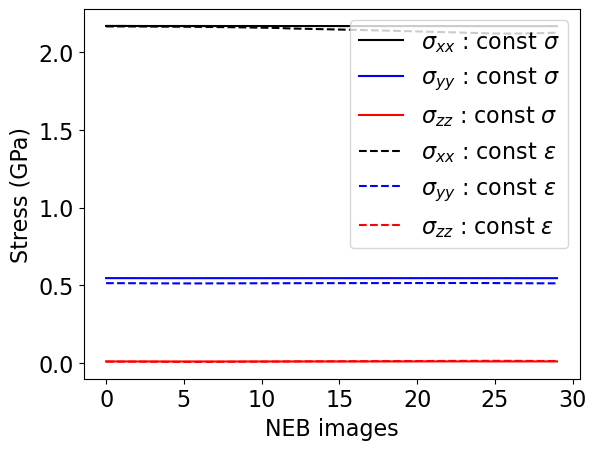

In [51]:
plt.rcParams['font.size'] = 16
plt.plot(s_xx_npt, 'k-', label=r'$\sigma_{xx}$ : const $\sigma$')
plt.plot(s_yy_npt, 'b-',  label=r'$\sigma_{yy}$ : const $\sigma$')
plt.plot(s_zz_npt, 'r-', label=r'$\sigma_{zz}$ : const $\sigma$')
plt.plot(s_xx_nvt, 'k--',label=r'$\sigma_{xx}$ : const $\epsilon$')
plt.plot(s_yy_nvt, 'b--',label=r'$\sigma_{yy}$ : const $\epsilon$')
plt.plot(s_zz_nvt, 'r--',label=r'$\sigma_{zz}$ : const $\epsilon$')
plt.legend()
plt.ylabel('Stress (GPa)')
plt.xlabel('NEB images')
plt.savefig('Change in stress.png', bbox_inches='tight')

In [2]:
168.267*177.09*75

2234880.22725